In [ ]:
import os
from PIL import Image
import numpy as np
import torch
from TransNetV2.transnet import TransNetV2
import cv2
import json
import argparse
from transformers import CLIPProcessor, CLIPModel
from sklearn.cluster import DBSCAN
import faiss
from keyframe_extraction import process_video
import hdbscan

: 

In [2]:
model = TransNetV2()
state_dict = torch.load("TransNetV2/transnetv2-pytorch-weights.pth")
model.eval()
model.load_state_dict(state_dict)

<All keys matched successfully>

In [ ]:
segment_metadata, keyframe_list = process_video("../Dataset/00045.mp4", "./Test_clustering", model, True)

Trying for ../Dataset/00045.mp4
[TransNetV2] Processing video frames 24781/24781
Processing 00045: 24781 frames, 3 shots detected.
 Low keyframe density (0.0036 keyframes/sec). Triggering fallback...


In [3]:
segment_metadata_2, keyframe_list_2 = process_video("../Dataset/00009.mp4", "./Test_clustering", model, True)

Using a slow image processor as `use_fast` is unset and a slow processor was saved with this model. `use_fast=True` will be the default behavior in v4.52, even if the model was saved with a slow processor. This will result in minor differences in outputs. You'll still be able to use a slow processor with `use_fast=False`.


Trying for ../Dataset/00009.mp4
[TransNetV2] Processing video frames 5489/5489
Processing 00009: 5489 frames, 3 shots detected.
 Low keyframe density (0.0131 keyframes/sec). Triggering fallback...


In [ ]:

inputs = processor(images=keyframe_list_2, return_tensors="pt", padding=True)
with torch.no_grad():
    feats = CLIP_model.get_image_features(**inputs)
# Normalize to unit length (L2)
feats = feats / feats.norm(dim=-1, keepdim=True)
embeddings = feats.cpu().numpy().astype('float32')


In [25]:
# Clustering of similar keyframes
db = DBSCAN(eps=0.1, min_samples=1, metric='cosine')
labels = db.fit_predict(embeddings)

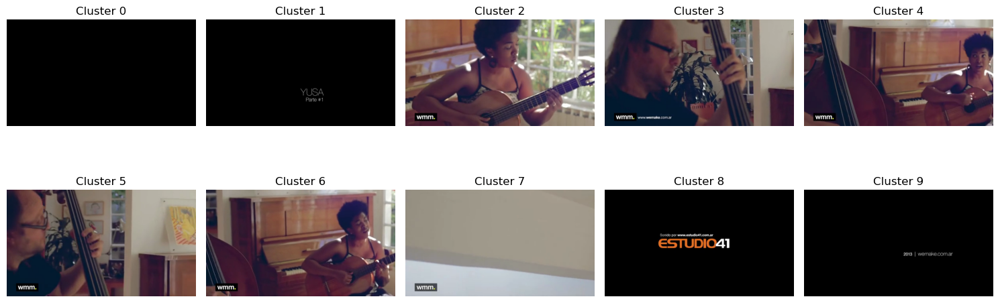

In [24]:
import matplotlib.pyplot as plt
from math import ceil
from collections import defaultdict

# --------------------------------------------------
# 1.  Build “cluster → list(indices)” mapping
# --------------------------------------------------
cluster_to_indices = defaultdict(list)
for idx, lbl in enumerate(labels):                 # «labels» from DBSCAN/HDBSCAN
    cluster_to_indices[lbl].append(idx)

# --------------------------------------------------
# 2.  Pick the REPRESENTATIVE index (medoid) per cluster
#     – assumes `embeddings` are unit-norm CLIP vectors
# --------------------------------------------------
repr_idx = []                                      # one idx per cluster
for lbl, idxs in cluster_to_indices.items():
    if lbl == -1:                                  # noise = singletons
        repr_idx.extend(idxs)
        continue

    embs = embeddings[idxs]                        # (m, 512)
    centroid = embs.mean(axis=0, keepdims=True)
    centroid /= (centroid**2).sum()**0.5           # re-normalise

    # cosine sims (dot product) to centroid ➜ pick the most central frame
    sims = (embs @ centroid.T).ravel()
    repr_idx.append(idxs[sims.argmax()])

# --------------------------------------------------
# 3.  Visualise the representatives in a tidy grid
# --------------------------------------------------
n   = len(repr_idx)
cols = min(5, n)                                   # up to 5 per row
rows = ceil(n / cols)

plt.figure(figsize=(3*cols, 3*rows))
for i, idx in enumerate(repr_idx, 1):
    plt.subplot(rows, cols, i)
    plt.imshow(keyframe_list_2[idx])               # your list of PIL images
    lbl = labels[idx]
    plt.title(f"Cluster {lbl}" if lbl != -1 else "Noise")
    plt.axis("off")

plt.tight_layout()
plt.show()


Cluster -1: 6 images


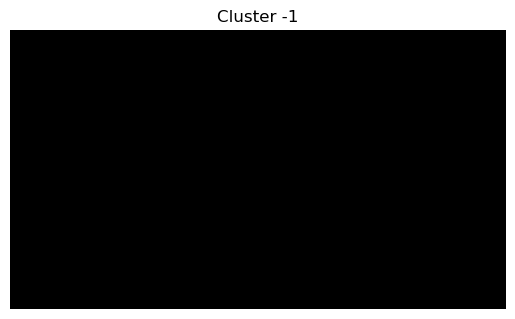

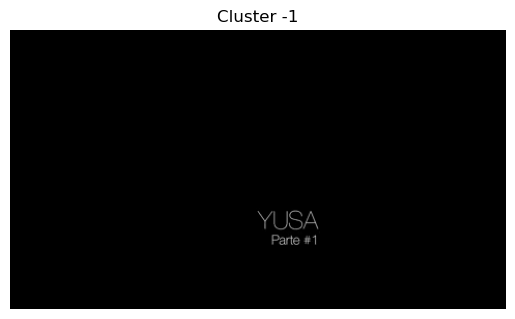

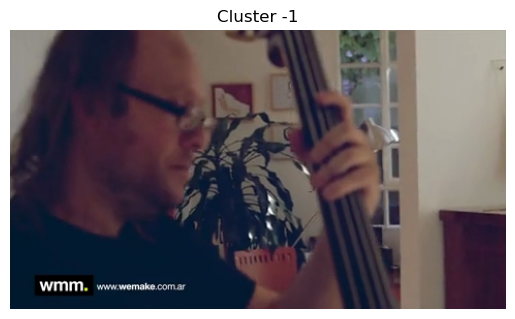

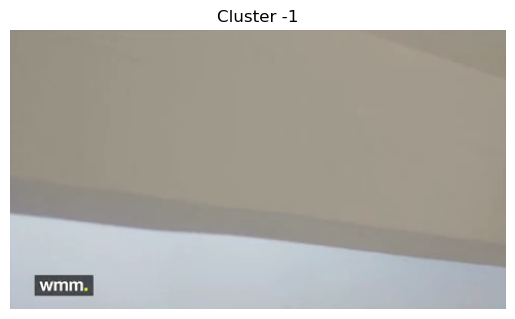

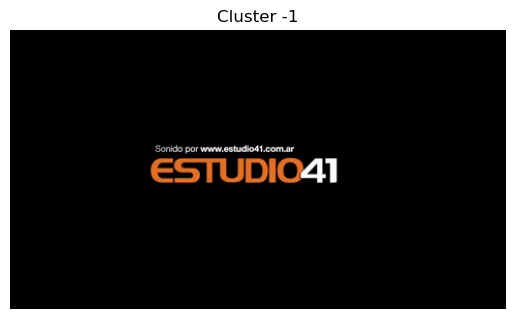

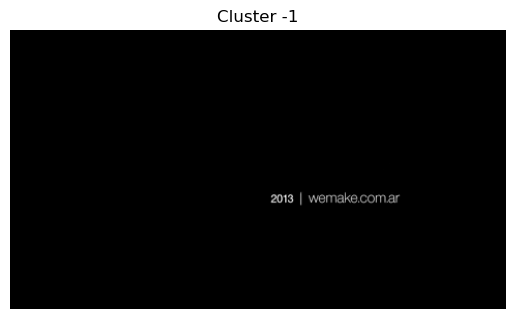

Cluster 0: 31 images


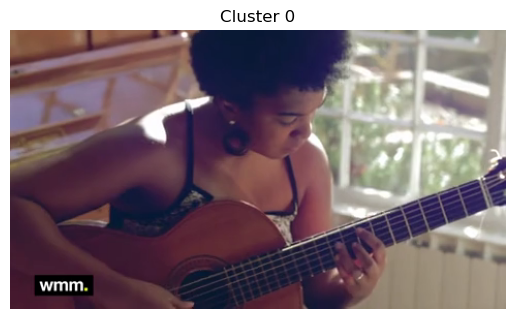

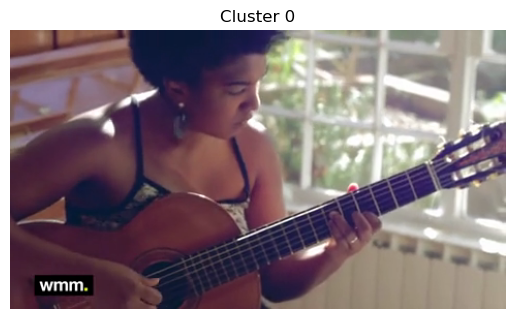

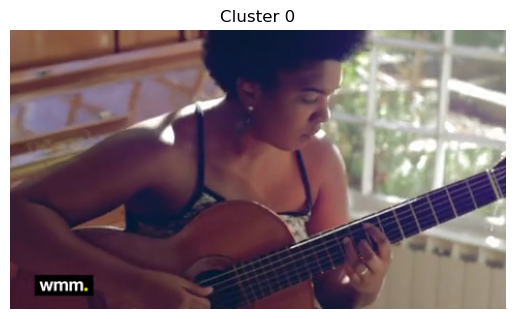

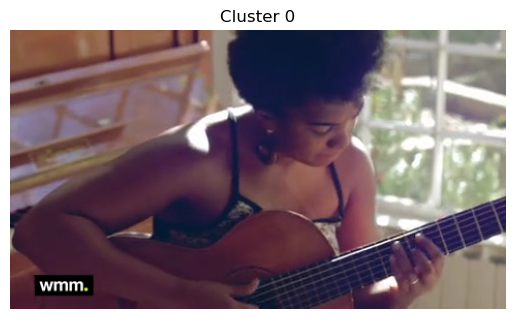

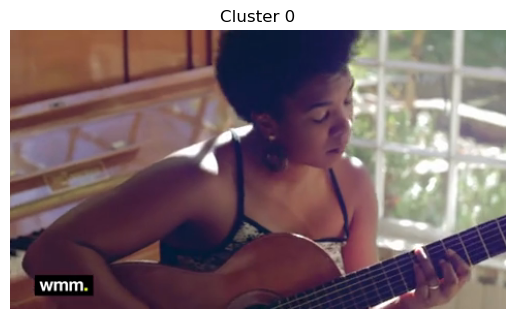

...

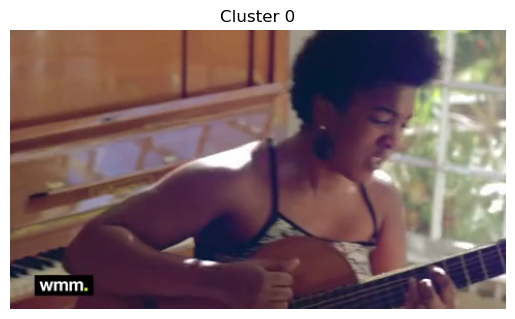

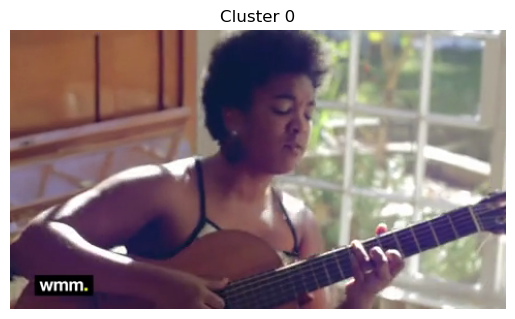

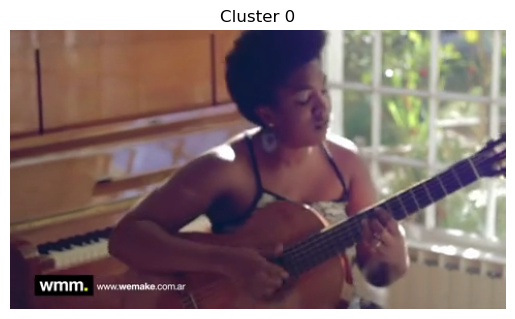

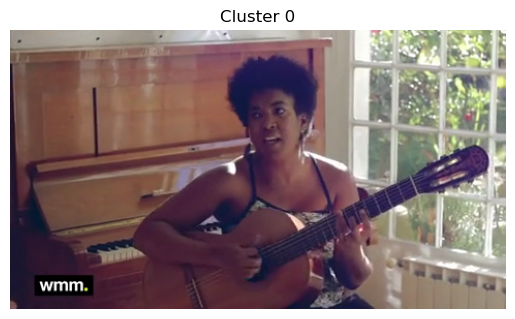

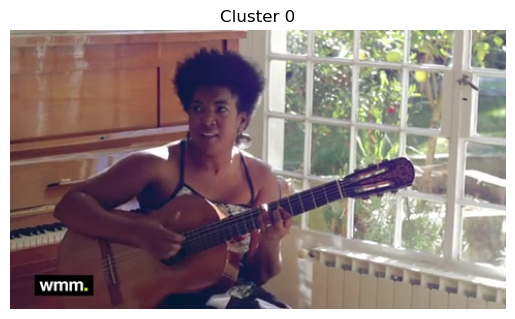

Cluster 1: 6 images


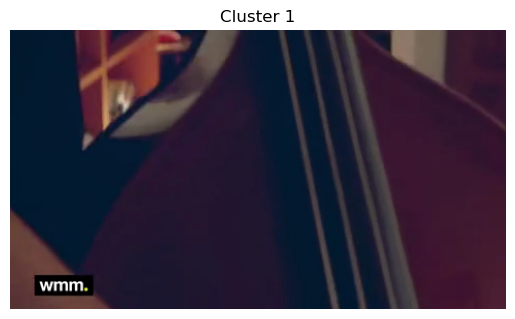

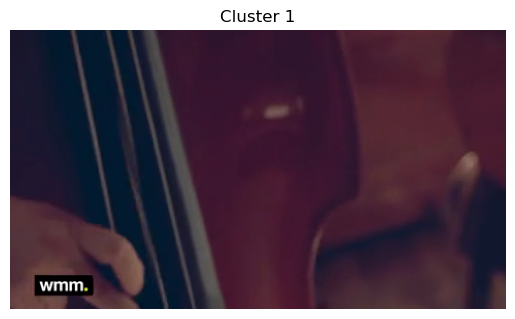

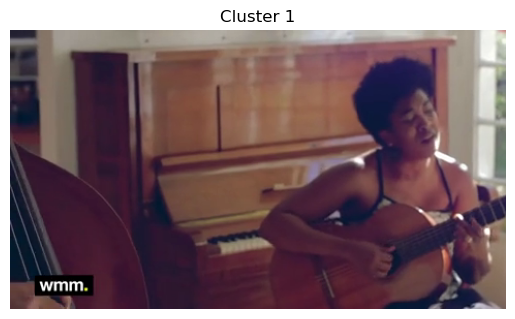

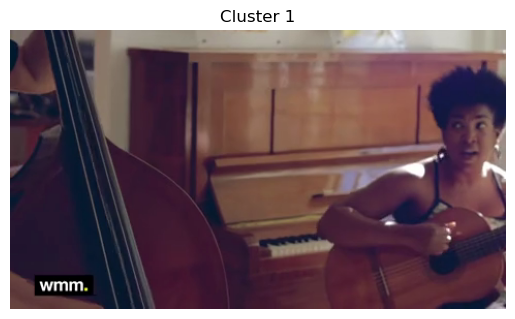

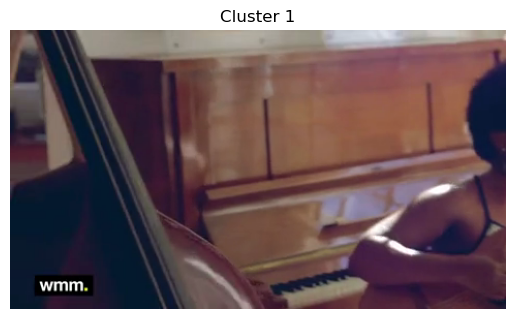

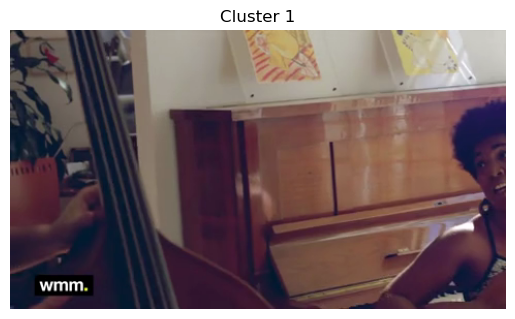

Cluster 2: 3 images


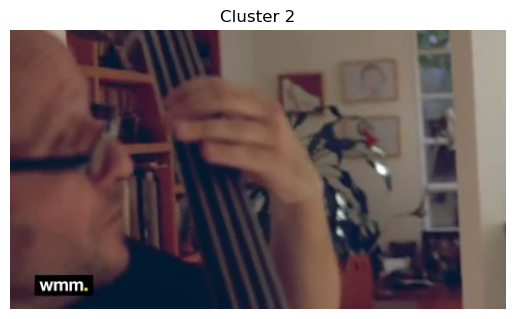

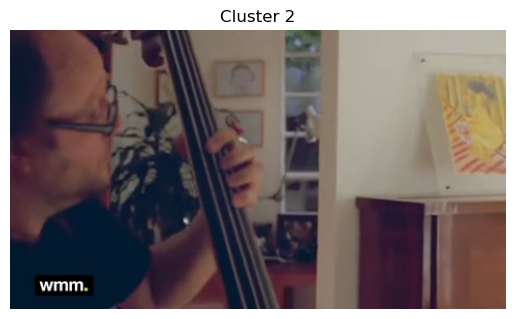

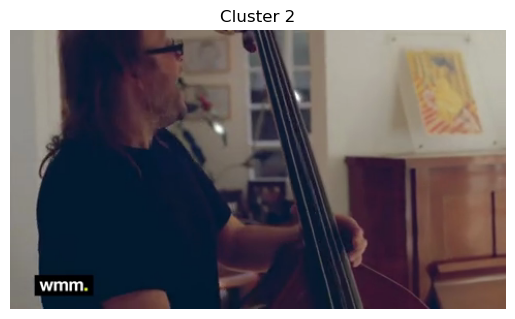

In [10]:
import matplotlib.pyplot as plt


# Group indices by cluster label
from collections import defaultdict
cluster_to_indices = defaultdict(list)
for idx, label in enumerate(labels):
    cluster_to_indices[label].append(idx)

# Plot images, grouped by cluster
for cluster, indices in cluster_to_indices.items():
    print(f"Cluster {cluster}: {len(indices)} images")
    for i, idx in enumerate(indices):
        plt.figure()
        plt.imshow(keyframe_list_2[idx])
        plt.title(f"Cluster {cluster}")
        plt.axis('off')
        plt.show()